# lab4

## Project 1-add and estimate noise

--- 噪声参数估计 ---
真实高斯噪声 -> 均值: 0.05, 方差: 0.02
估计高斯噪声 -> 均值: 0.0873, 方差: 0.0097


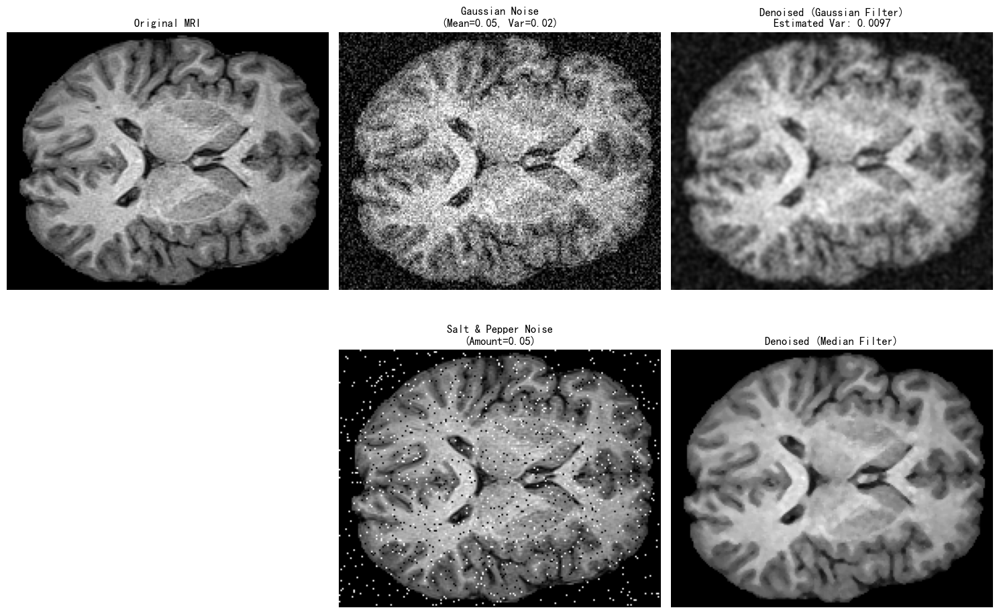

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, median_filter

def normalize_image(image):
    """将图像归一化到 0-1 范围，方便统一处理噪声"""
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def main():
    # ==========================================
    # 0. 加载数据
    # ==========================================
    file_path = './lab4/data/lab4-1.npy'
    try:
        # 加载 MRI 数据
        image = np.load(file_path)
        # 如果数据是 3D 的（多个切片），我们取中间的一个切片进行 2D 演示
        if image.ndim == 3:
            image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        print(f"找不到文件: {file_path}。请确保路径正确，以下将使用测试矩阵代替。")
        image = np.linspace(0, 1, 256*256).reshape(256, 256)
    
    # 归一化图像以稳定噪声参数的影响
    img_norm = normalize_image(image)

    # ==========================================
    # 1. 添加高斯噪声 (Gaussian Noise)
    # ==========================================
    # 指定高斯噪声的均值 (Mean) 和 方差 (Variance)
    gauss_mean = 0.05
    gauss_variance = 0.02
    gauss_std = np.sqrt(gauss_variance) # 标准差是方差的平方根
    
    # 生成与图像尺寸相同的高斯噪声阵列
    gaussian_noise = np.random.normal(gauss_mean, gauss_std, img_norm.shape)
    img_gaussian = img_norm + gaussian_noise
    img_gaussian = np.clip(img_gaussian, 0, 1) # 限制像素值在有效范围内

    # ==========================================
    # 2. 添加椒盐噪声 (Salt & Pepper Noise)
    # ==========================================
    # 指定椒盐噪声的参数：噪声比例 (amount) 和 盐/椒的比例 (salt_vs_pepper)
    sp_amount = 0.05        # 5% 的像素会被污染
    salt_vs_pepper = 0.5    # 盐(白点)和椒(黑点)各占一半
    
    img_sp = np.copy(img_norm)
    num_salt = np.ceil(sp_amount * img_norm.size * salt_vs_pepper)
    num_pepper = np.ceil(sp_amount * img_norm.size * (1.0 - salt_vs_pepper))
    
    # 添加盐噪声 (白)
    coords_salt = [np.random.randint(0, i - 1, int(num_salt)) for i in img_norm.shape]
    img_sp[tuple(coords_salt)] = 1
    # 添加椒噪声 (黑)
    coords_pepper = [np.random.randint(0, i - 1, int(num_pepper)) for i in img_norm.shape]
    img_sp[tuple(coords_pepper)] = 0

    # ==========================================
    # 3. 估计噪声模型参数 (Estimation)
    # ==========================================
    # 方法：在医学 MRI 图像中，背景区域（如图像的四个角落）通常只有空气，
    # 这些区域的信号波动几乎完全由噪声引起。我们选取左上角的一个 ROI (感兴趣区域) 来估计。
    roi_size = 30
    background_roi = img_gaussian[0:roi_size, 0:roi_size]
    
    estimated_mean = np.mean(background_roi)
    estimated_variance = np.var(background_roi)
    print(f"--- 噪声参数估计 ---")
    print(f"真实高斯噪声 -> 均值: {gauss_mean}, 方差: {gauss_variance}")
    print(f"估计高斯噪声 -> 均值: {estimated_mean:.4f}, 方差: {estimated_variance:.4f}")

    # ==========================================
    # 4. 根据估计参数进行降噪 (Denoising)
    # ==========================================
    # 对于高斯噪声：使用高斯滤波器平滑。滤波器的 sigma 参数可以基于我们估计的方差来设置。
    # 方差越大，我们需要的平滑力度 (sigma) 越大。这里做一个简单的线性映射示范。
    filter_sigma = np.sqrt(estimated_variance) * 10 
    img_denoised_gauss = gaussian_filter(img_gaussian, sigma=filter_sigma)

    # 对于椒盐噪声：中值滤波是去除椒盐噪声最经典且有效的方法。
    img_denoised_sp = median_filter(img_sp, size=3)

    # ==========================================
    # 5. 结果可视化
    # ==========================================
    plt.figure(figsize=(15, 10))
    
    plt.subplot(2, 3, 1)
    plt.imshow(img_norm, cmap='gray')
    plt.title('Original MRI')
    plt.axis('off')

    plt.subplot(2, 3, 2)
    plt.imshow(img_gaussian, cmap='gray')
    plt.title(f'Gaussian Noise\n(Mean={gauss_mean}, Var={gauss_variance})')
    plt.axis('off')

    plt.subplot(2, 3, 3)
    plt.imshow(img_denoised_gauss, cmap='gray')
    plt.title(f'Denoised (Gaussian Filter)\nEstimated Var: {estimated_variance:.4f}')
    plt.axis('off')

    plt.subplot(2, 3, 5)
    plt.imshow(img_sp, cmap='gray')
    plt.title(f'Salt & Pepper Noise\n(Amount={sp_amount})')
    plt.axis('off')

    plt.subplot(2, 3, 6)
    plt.imshow(img_denoised_sp, cmap='gray')
    plt.title('Denoised (Median Filter)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

大模型未能正确理解项目的要求，我补充说明：我认为你目前内容有很多问题，首先实验的要求是添加高斯噪声，并且根据图像的噪声估计噪声的参数，然后再使用滤波器降噪。然后是要添加不同参数的椒盐噪声，再估计图像的噪声，再使用滤波器降噪。我需要你提供至少三种参数的椒盐噪声。针对两端噪声不同的处理可以分两段程序来写。

后续改进的程序如下。

[高斯噪声] 真实设定: 均值=0.0, 方差=0.02
[高斯噪声] 估计结果: 均值=0.0449, 方差=0.0334


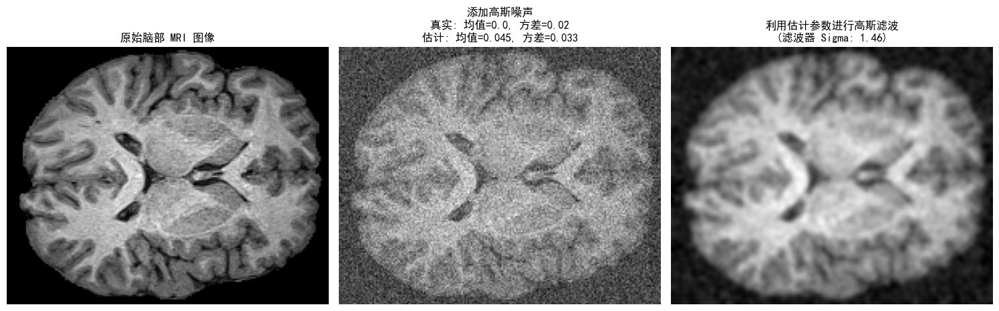

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import matplotlib

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    """将图像归一化到 0-1 范围"""
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def estimate_gaussian_noise(noisy_img, roi_size=40):
    """
    估计高斯噪声的均值和方差。
    方法：选取图像左上角的纯背景区域 (ROI)，计算其均值和方差。
    """
    # 假设图像左上角 [0:40, 0:40] 是无脑组织的纯背景区域
    background_roi = noisy_img[0:roi_size, 0:roi_size]
    est_mean = np.mean(background_roi)
    est_var = np.var(background_roi)
    return est_mean, est_var

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        print("找不到文件，使用测试图像替代。")
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1 # 测试块
    
    img_norm = normalize_image(image)

    # 2. 添加高斯噪声
    true_mean = 0.0
    true_var = 0.02
    noise = np.random.normal(true_mean, np.sqrt(true_var), img_norm.shape)
    img_noisy = img_norm + noise
    
    # 3. 从含噪图像中估计噪声参数
    est_mean, est_var = estimate_gaussian_noise(img_noisy)
    print(f"[高斯噪声] 真实设定: 均值={true_mean}, 方差={true_var}")
    print(f"[高斯噪声] 估计结果: 均值={est_mean:.4f}, 方差={est_var:.4f}")

    # 4. 根据估计出的参数进行降噪
    # 这里的逻辑是：估计出的方差越大，说明噪声越严重，高斯滤波器的 sigma 平滑系数就需要设置得越大
    # 我们用一个基于估计方差的经验公式来设置 sigma
    filter_sigma = np.sqrt(est_var) * 8 
    img_denoised = gaussian_filter(img_noisy, sigma=filter_sigma)

    # 5. 可视化
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_norm, cmap='gray')
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_noisy, cmap='gray')
    plt.title(f'添加高斯噪声\n真实: 均值={true_mean}, 方差={true_var}\n估计: 均值={est_mean:.3f}, 方差={est_var:.3f}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_denoised, cmap='gray')
    plt.title(f'利用估计参数进行高斯滤波\n(滤波器 Sigma: {filter_sigma:.2f})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

[椒盐噪声 1] 真实密度: 5.0%, 估计密度: 30.25%
[椒盐噪声 2] 真实密度: 15.0%, 估计密度: 36.82%
[椒盐噪声 3] 真实密度: 30.0%, 估计密度: 45.91%


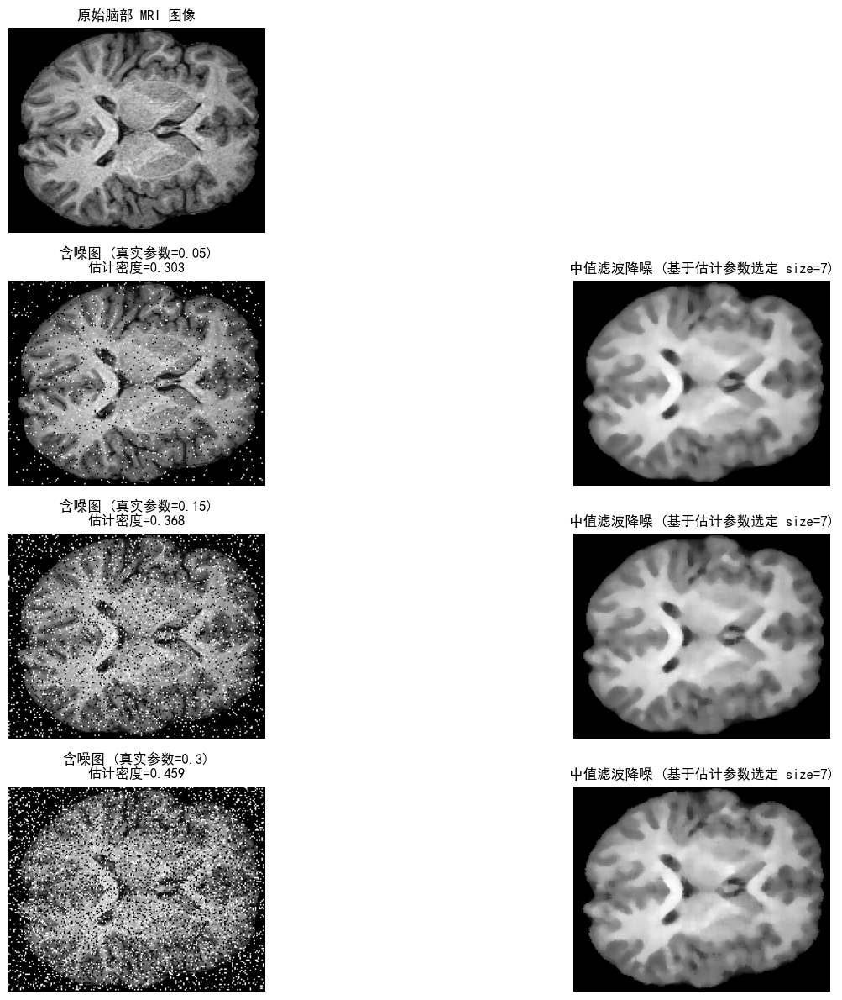

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter
import matplotlib

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def add_salt_and_pepper_noise(image, amount, salt_vs_pepper=0.5):
    """向图像添加指定比例的椒盐噪声"""
    noisy_img = np.copy(image)
    
    # 盐噪声 (白点)
    num_salt = np.ceil(amount * image.size * salt_vs_pepper)
    coords_salt = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_img[tuple(coords_salt)] = 1.0

    # 椒噪声 (黑点)
    num_pepper = np.ceil(amount * image.size * (1.0 - salt_vs_pepper))
    coords_pepper = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_img[tuple(coords_pepper)] = 0.0
    
    return noisy_img

def estimate_sp_noise_amount(noisy_img):
    """
    估计椒盐噪声的密度 (Amount)。
    方法：由于图像已经归一化到 0~1，被椒盐噪声污染的像素会变成绝对的 0 或 1。
    我们统计图像中等于 0.0 和 1.0 的像素数量占总像素的比例。
    """
    num_extremes = np.sum((noisy_img == 0.0) | (noisy_img == 1.0))
    est_amount = num_extremes / noisy_img.size
    return est_amount

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1
    
    img_norm = normalize_image(image)

    # 2. 定义三种不同的椒盐噪声参数 (5%, 15%, 30% 污染率)
    noise_amounts = [0.05, 0.15, 0.30]
    
    plt.figure(figsize=(15, 12))
    
    # 画出原图作为参考
    plt.subplot(4, 2, 1)
    plt.imshow(img_norm, cmap='gray')
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')
    
    # 遍历三种不同的噪声参数
    for i, true_amount in enumerate(noise_amounts):
        # A. 添加噪声
        img_noisy = add_salt_and_pepper_noise(img_norm, amount=true_amount)
        
        # B. 估计噪声密度
        est_amount = estimate_sp_noise_amount(img_noisy)
        print(f"[椒盐噪声 {i+1}] 真实密度: {true_amount*100:.1f}%, 估计密度: {est_amount*100:.2f}%")
        
        # C. 根据估计的参数进行降噪
        # 逻辑：对于中值滤波，噪声密度越大，我们需要越大的滤波窗口 (size) 才能抹掉相连的噪点
        # 根据估计密度自适应调整滤波器 size (奇数)
        if est_amount < 0.10:
            filter_size = 3
        elif est_amount < 0.25:
            filter_size = 5
        else:
            filter_size = 7
            
        img_denoised = median_filter(img_noisy, size=filter_size)

        # D. 可视化绘制
        row = i + 1
        plt.subplot(4, 2, 2*row + 1)
        plt.imshow(img_noisy, cmap='gray')
        plt.title(f'含噪图 (真实参数={true_amount})\n估计密度={est_amount:.3f}')
        plt.axis('off')

        plt.subplot(4, 2, 2*row + 2)
        plt.imshow(img_denoised, cmap='gray')
        plt.title(f'中值滤波降噪 (基于估计参数选定 size={filter_size})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

高斯噪声估计的参数误差不大，但是滤波重建效果很差。椒盐噪声估计的参数误差就很大，滤波重建效果也很不好。

[高斯噪声] 真实设定: 均值=0.05, 方差=0.02
[高斯噪声] 估计结果: 均值=0.0502, 方差=0.0195


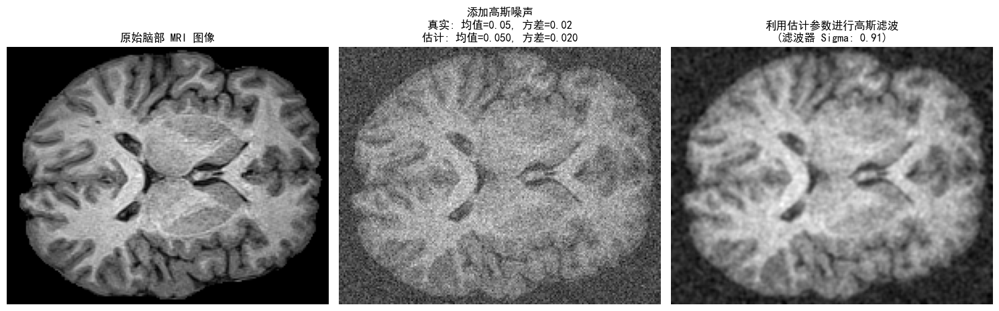

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import matplotlib

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    """将图像归一化到 0-1 范围"""
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def estimate_gaussian_noise(noisy_img, roi_size=30):
    """
    估计高斯噪声的均值和方差。
    方法：选取图像左上角的纯背景区域 (ROI)，计算其均值和方差。
    """
    background_roi = noisy_img[0:roi_size, 0:roi_size]
    est_mean = np.mean(background_roi)
    est_var = np.var(background_roi)
    return est_mean, est_var

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        print("找不到文件，使用测试图像替代。")
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1 # 测试块
    
    img_norm = normalize_image(image)

    # 2. 添加高斯噪声
    true_mean = 0.05
    true_var = 0.02
    noise = np.random.normal(true_mean, np.sqrt(true_var), img_norm.shape)
    img_noisy = img_norm + noise
    
    # 3. 从含噪图像中估计噪声参数
    est_mean, est_var = estimate_gaussian_noise(img_noisy)
    print(f"[高斯噪声] 真实设定: 均值={true_mean}, 方差={true_var}")
    print(f"[高斯噪声] 估计结果: 均值={est_mean:.4f}, 方差={est_var:.4f}")

    # 4. 根据估计出的参数进行降噪
    # 这里的逻辑是：估计出的方差越大，说明噪声越严重，高斯滤波器的 sigma 平滑系数就需要设置得越大
    # 我们用一个基于估计方差的经验公式来设置 sigma
    filter_sigma = np.sqrt(est_var) * 6.5
    img_denoised = gaussian_filter(img_noisy, sigma=filter_sigma)

    # 5. 可视化
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_norm, cmap='gray')
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_noisy, cmap='gray')
    plt.title(f'添加高斯噪声\n真实: 均值={true_mean}, 方差={true_var}\n估计: 均值={est_mean:.3f}, 方差={est_var:.3f}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_denoised, cmap='gray')
    plt.title(f'利用估计参数进行高斯滤波\n(滤波器 Sigma: {filter_sigma:.2f})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

[椒盐噪声 1] 真实密度: 5.0%, 估计密度: 4.81%
[椒盐噪声 2] 真实密度: 15.0%, 估计密度: 13.42%
[椒盐噪声 3] 真实密度: 30.0%, 估计密度: 23.69%


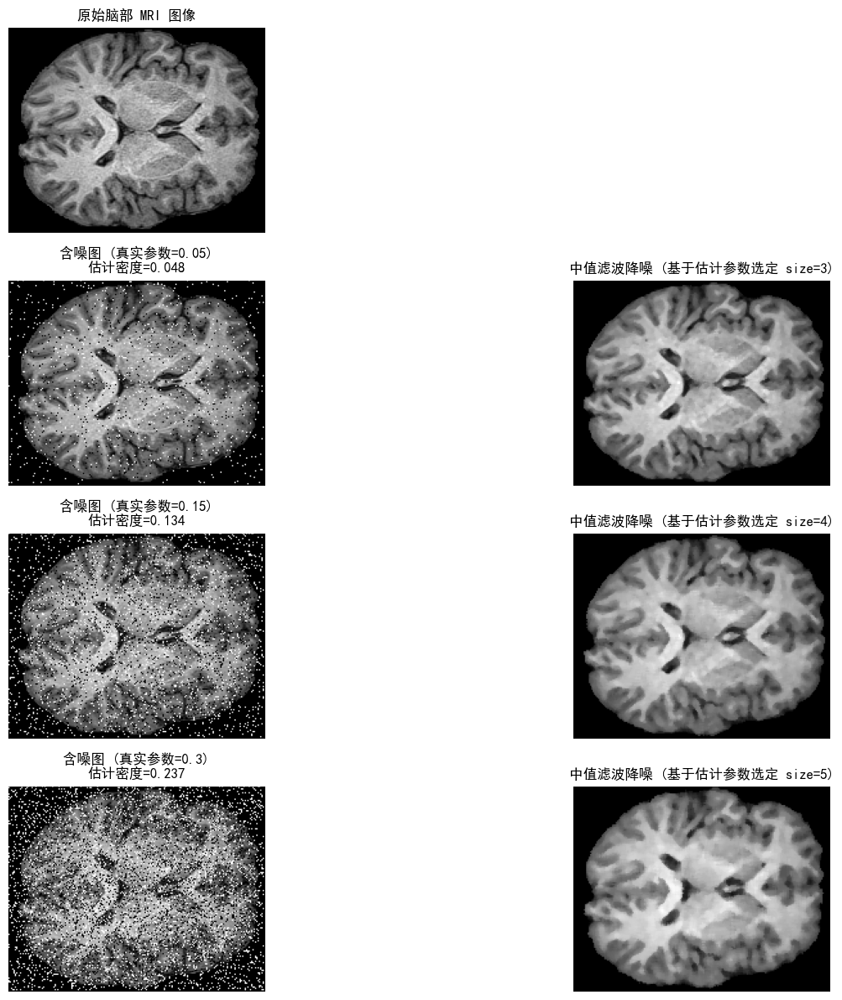

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter
import matplotlib

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def add_salt_and_pepper_noise(image, amount, salt_vs_pepper=0.5):
    """向图像添加指定比例的椒盐噪声"""
    noisy_img = np.copy(image)
    
    # 盐噪声 (白点)
    num_salt = np.ceil(amount * image.size * salt_vs_pepper)
    coords_salt = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_img[tuple(coords_salt)] = 1.0

    # 椒噪声 (黑点)
    num_pepper = np.ceil(amount * image.size * (1.0 - salt_vs_pepper))
    coords_pepper = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_img[tuple(coords_pepper)] = 0.0
    
    return noisy_img

def estimate_sp_noise_amount(noisy_img):
    """
    改进的估计方法：
    因为 MRI 图像本身包含大量值为 0.0 的黑色背景，
    如果统计 0.0 会导致严重高估。因此我们只统计 1.0 (盐噪声) 的比例，
    然后乘以 2 (假设盐和椒各占 50%)。
    """
    # 设定一个极小的阈值容差，防止浮点数精度问题
    num_salt = np.sum(noisy_img >= 0.99)
    
    # 估计总密度 = 盐噪声占比 * 2
    est_amount = (num_salt / noisy_img.size) * 2
    return est_amount

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1
    
    img_norm = normalize_image(image)

    # 2. 定义三种不同的椒盐噪声参数 (5%, 15%, 30% 污染率)
    noise_amounts = [0.05, 0.15, 0.30]
    
    plt.figure(figsize=(15, 12))
    
    # 画出原图作为参考
    plt.subplot(4, 2, 1)
    plt.imshow(img_norm, cmap='gray')
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')
    
    # 遍历三种不同的噪声参数
    for i, true_amount in enumerate(noise_amounts):
        # A. 添加噪声
        img_noisy = add_salt_and_pepper_noise(img_norm, amount=true_amount)
        
        # B. 估计噪声密度
        est_amount = estimate_sp_noise_amount(img_noisy)
        print(f"[椒盐噪声 {i+1}] 真实密度: {true_amount*100:.1f}%, 估计密度: {est_amount*100:.2f}%")
        
        # C. 根据估计的参数进行降噪
        # 逻辑：对于中值滤波，噪声密度越大，我们需要越大的滤波窗口 (size) 才能抹掉相连的噪点
        # 根据估计密度自适应调整滤波器 size (奇数)
        if est_amount < 0.10:
            filter_size = 3
        elif est_amount < 0.2:
            filter_size = 4
        else:
            filter_size = 5
            
        img_denoised = median_filter(img_noisy, size=filter_size)

        # D. 可视化绘制
        row = i + 1
        plt.subplot(4, 2, 2*row + 1)
        plt.imshow(img_noisy, cmap='gray')
        plt.title(f'含噪图 (真实参数={true_amount})\n估计密度={est_amount:.3f}')
        plt.axis('off')

        plt.subplot(4, 2, 2*row + 2)
        plt.imshow(img_denoised, cmap='gray')
        plt.title(f'中值滤波降噪 (基于估计参数选定 size={filter_size})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

高斯滤波的效果很差，换用维纳滤波器尝试。

真实设定 -> 均值: 0.05, 方差: 0.02
估计结果 -> 均值: 0.0456, 方差: 0.0208


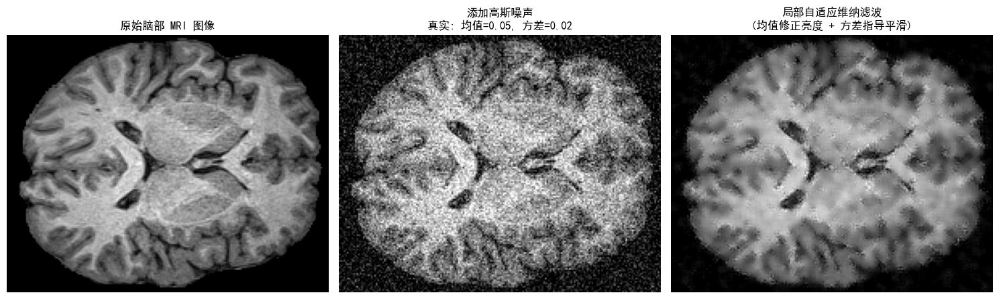

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from scipy.signal import wiener  # 引入自适应维纳滤波

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    """将图像归一化到 0-1 范围"""
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def estimate_gaussian_noise(noisy_img, roi_size=30):
    """选取图像左上角纯背景区域估计高斯噪声均值和方差"""
    background_roi = noisy_img[0:roi_size, 0:roi_size]
    return np.mean(background_roi), np.var(background_roi)

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        print("找不到文件，使用测试图像替代。")
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1 
    
    img_norm = normalize_image(image)

    # 2. 添加高斯噪声
    true_mean = 0.05
    true_var = 0.02
    noise = np.random.normal(true_mean, np.sqrt(true_var), img_norm.shape)
    img_noisy = img_norm + noise
    
    # 3. 盲估计噪声参数
    est_mean, est_var = estimate_gaussian_noise(img_noisy, roi_size=30)
    print(f"真实设定 -> 均值: {true_mean}, 方差: {true_var}")
    print(f"估计结果 -> 均值: {est_mean:.4f}, 方差: {est_var:.4f}")

    # ==================================================
    # 4. 最优降噪：均值修正 + 局部自适应维纳滤波
    # ==================================================
    
    # 步骤 A: 完美利用估计均值 (est_mean)，修正亮度漂移
    img_corrected = img_noisy - est_mean
    
    # 步骤 B: 局部自适应维纳滤波
    # mysize=(5, 5): 设定局部统计窗口的大小。
    # noise=est_var: 【核心！】直接将我们盲估计出来的全局噪声方差喂给算法，指导其进行最优平滑！
    img_denoised = wiener(img_corrected, mysize=(5, 5), noise=est_var)
    
    # 限制显示范围防溢出
    img_denoised = np.clip(img_denoised, 0, 1)

    # 5. 可视化
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_norm, cmap='gray', vmin=0, vmax=1)
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_noisy, cmap='gray', vmin=0, vmax=1)
    plt.title(f'添加高斯噪声\n真实: 均值={true_mean}, 方差={true_var}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_denoised, cmap='gray', vmin=0, vmax=1)
    plt.title('局部自适应维纳滤波\n(均值修正亮度 + 方差指导平滑)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

效果比高斯滤波好一些，但仍然不够清晰，最后换用NLM滤波器

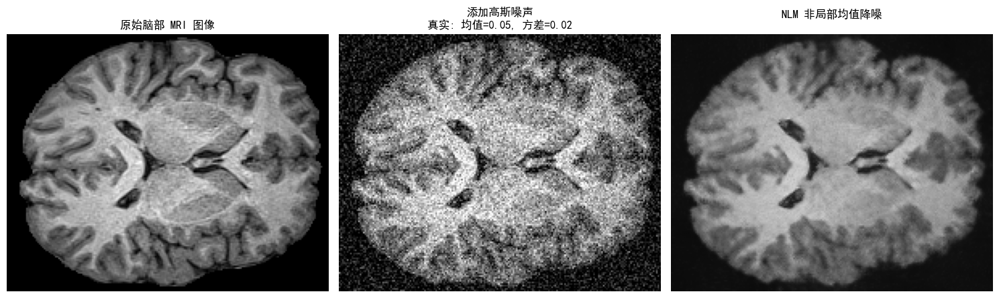

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from skimage.restoration import denoise_nl_means

# 设置中文字体
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def estimate_gaussian_noise(noisy_img, roi_size=30):
    background_roi = noisy_img[0:roi_size, 0:roi_size]
    return np.mean(background_roi), np.var(background_roi)

def main():
    # 1. 加载数据
    file_path = './lab4/data/lab4-1.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1 
    
    img_norm = normalize_image(image)

    # 2. 添加高斯噪声
    true_mean = 0.05
    true_var = 0.02
    noise = np.random.normal(true_mean, np.sqrt(true_var), img_norm.shape)
    img_noisy = img_norm + noise
    
    # 3. 盲估计噪声参数
    est_mean, est_var = estimate_gaussian_noise(img_noisy, roi_size=30)
    
    # ==================================================
    # 4. 终极降噪：均值修正 + NLM (非局部均值)
    # ==================================================
    
    # A: 修正均值漂移
    img_corrected = np.clip(img_noisy - est_mean, 0, 1)
    
    # B: 提取估计的噪声标准差
    est_sigma = np.sqrt(est_var) 
    
    # C: 使用 NLM 进行非局部降噪
    # h 是平滑参数。数学证明表明，当 h 设为噪声标准差的 1.0 ~ 1.2 倍时，效果最佳。
    # 这里我们直接喂给它我们精准估计出的 est_sigma！
    img_denoised = denoise_nl_means(
        img_corrected, 
        h=0.8 * est_sigma,       # <--- 完美利用估计方差
        fast_mode=True,           # 开启加速计算
        patch_size=5,             # 用于比较的图像块大小
        patch_distance=15,        # 搜索相似块的范围
        channel_axis=None         # 指定非多通道图像
    )

    # 5. 可视化
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(img_norm, cmap='gray', vmin=0, vmax=1)
    plt.title('原始脑部 MRI 图像')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(img_noisy, cmap='gray', vmin=0, vmax=1)
    plt.title(f'添加高斯噪声\n真实: 均值={true_mean}, 方差={true_var}')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(img_denoised, cmap='gray', vmin=0, vmax=1)
    plt.title('NLM 非局部均值降噪\n')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

## Project 2 morphological operations

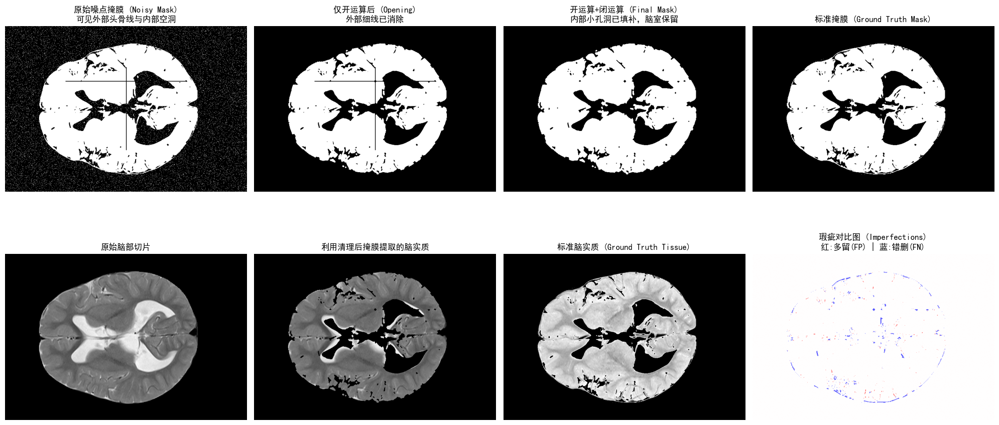

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os
from scipy.ndimage import binary_opening, binary_closing, generate_binary_structure

# ==========================================
# 解决 matplotlib 中文显示问题
# ==========================================
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def main():
    # ==========================================
    # 1. 加载数据
    # ==========================================
    # 根据你的提示，这里设定基础路径
    base_dir = './lab4/data/lab4-2'
    
    # 尝试加载四个必要的文件
    try:
        noisy_mask = np.load(os.path.join(base_dir, 'noisy_brain_mask.npy'))
        true_mask = np.load(os.path.join(base_dir, 'brain_tissue_mask_slice.npy'))
        original_img = np.load(os.path.join(base_dir, 'original_brain_slice_.npy'))
        # 提取真实的大脑组织图 (Ground Truth)
        true_tissue = np.load(os.path.join(base_dir, 'brain_tissue_slice.npy')) 
    except FileNotFoundError as e:
        print(f"文件加载失败，请检查路径。详细错误: {e}")
        return

    # 确保掩膜是布尔类型的二值图像 (True/False 或 1/0)
    noisy_mask = noisy_mask.astype(bool)
    true_mask = true_mask.astype(bool)

    # ==========================================
    # 2. 形态学操作降噪与修复 (核心逻辑)
    # ==========================================
    # 创建一个结构元素 (这里使用 3x3 的十字形印章，连通性为 1)
    # 根据噪声的大小，你也可以用 np.ones((5,5)) 创建更大的印章
    struct_elem = generate_binary_structure(rank=2, connectivity=1)
    
    # 步骤 A：开运算 (Opening)
    # 目的：消除大脑外部的细头骨线（外部伪影/假阳性）和毛刺边界
    # 解释：先腐蚀掉细线，再膨胀恢复大脑主体大小
    mask_opened = binary_opening(noisy_mask, structure=struct_elem, iterations=2)

    # 步骤 B：闭运算 (Closing)
    # 目的：填补大脑主体内部因为噪声产生的细小孔洞，同时保留脑室等巨大真实孔洞
    # 解释：对开运算的结果进行闭运算，先膨胀填上小黑洞，再腐蚀恢复大小
    final_cleaned_mask = binary_closing(mask_opened, structure=struct_elem, iterations=1)

    # ==========================================
    # 3. 缺陷检查与评估 (Imperfections check)
    # ==========================================
    # 将我们清理出的掩膜与专家给定的标准掩膜进行对比
    # 假阳性 (False Positive): 我们认为是脑子，但实际不是 (例如没清干净的头骨)
    false_positives = final_cleaned_mask & (~true_mask)
    # 假阴性 (False Negative): 我们认为不是脑子，但实际是 (例如内部真实的脑组织被错误抠掉)
    false_negatives = (~final_cleaned_mask) & true_mask
    
    error_map = np.zeros_like(original_img, dtype=float)
    error_map[false_positives] = 1.0 # 红色区域：多留的部分
    error_map[false_negatives] = -1.0 # 蓝色区域：错删的部分

    # ==========================================
    # 4. 提取最终脑实质 (Brain Parenchyma)
    # ==========================================
    # 将清理后的纯净掩膜应用到原图上，提取出脑组织
    # 掩膜为 True 的地方保留原图像素，False 的地方变为 0 (黑色)
    extracted_brain = np.copy(original_img)
    extracted_brain[~final_cleaned_mask] = 0

    # ==========================================
    # 5. 结果可视化
    # ==========================================
    plt.figure(figsize=(20, 10))

    # 第一行：掩膜的处理过程
    plt.subplot(2, 4, 1)
    plt.imshow(noisy_mask, cmap='gray')
    plt.title('原始噪点掩膜 (Noisy Mask)\n可见外部头骨线与内部空洞')
    plt.axis('off')

    plt.subplot(2, 4, 2)
    plt.imshow(mask_opened, cmap='gray')
    plt.title('仅开运算后 (Opening)\n外部细线已消除')
    plt.axis('off')

    plt.subplot(2, 4, 3)
    plt.imshow(final_cleaned_mask, cmap='gray')
    plt.title('开运算+闭运算 (Final Mask)\n内部小孔洞已填补，脑室保留')
    plt.axis('off')

    plt.subplot(2, 4, 4)
    plt.imshow(true_mask, cmap='gray')
    plt.title('标准掩膜 (Ground Truth Mask)')
    plt.axis('off')

    # 第二行：提取结果与误差分析
    plt.subplot(2, 4, 5)
    plt.imshow(original_img, cmap='gray')
    plt.title('原始脑部切片')
    plt.axis('off')

    plt.subplot(2, 4, 6)
    plt.imshow(extracted_brain, cmap='gray')
    plt.title('利用清理后掩膜提取的脑实质')
    plt.axis('off')

    plt.subplot(2, 4, 7)
    plt.imshow(true_tissue, cmap='gray')
    plt.title('标准脑实质 (Ground Truth Tissue)')
    plt.axis('off')

    # 误差热力图：展示我们处理的瑕疵
    plt.subplot(2, 4, 8)
    # 使用 bwr (Blue-White-Red) 色表：蓝色为假阴性，红色为假阳性，白色为正确
    plt.imshow(error_map, cmap='bwr', vmin=-1.5, vmax=1.5)
    plt.title('瑕疵对比图 (Imperfections)\n红:多留(FP) | 蓝:错删(FN)')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

## Project 3 restoration

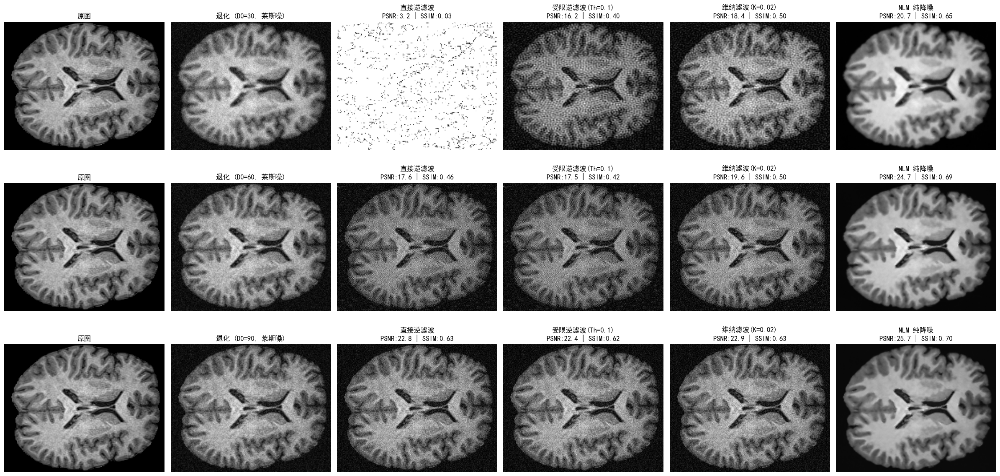

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.restoration import denoise_nl_means, estimate_sigma

# ==========================================
# 解决 matplotlib 中文显示问题
# ==========================================
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def create_gaussian_lowpass_filter(shape, D0):
    """创建频域高斯低通滤波器 (模糊核)"""
    P, Q = shape
    U = np.arange(P) - P // 2
    V = np.arange(Q) - Q // 2
    U, V = np.meshgrid(U, V, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    H = np.exp(-(D**2) / (2 * D0**2))
    return H

def add_rician_noise(image, sigma):
    """
    根据 PPT 公式添加莱斯噪声
    real = ν + ϵ_real, imaginary = 0 + ϵ_imag
    x = sqrt(real^2 + imag^2)
    """
    noise_real = np.random.normal(0, sigma, image.shape)
    noise_imag = np.random.normal(0, sigma, image.shape)
    noisy_image = np.sqrt((image + noise_real)**2 + noise_imag**2)
    return noisy_image

def evaluate_quality(original, restored):
    """计算 PSNR 和 SSIM，用于评估复原质量"""
    # 统一数据范围到 0-1
    img1 = np.clip(original, 0, 1)
    img2 = np.clip(restored, 0, 1)
    p_val = psnr(img1, img2, data_range=1.0)
    s_val = ssim(img1, img2, data_range=1.0)
    return p_val, s_val

def main():
    # ==========================================
    # 0. 加载与准备数据
    # ==========================================
    file_path = './lab4/data/lab4-3.npy'
    try:
        image = np.load(file_path)
        if image.ndim == 3: image = image[:, :, image.shape[2] // 2]
    except FileNotFoundError:
        image = np.zeros((256, 256)); image[64:192, 64:192] = 1
    
    img_norm = normalize_image(image)
    
    # 获取图像的傅里叶变换
    F_img = np.fft.fftshift(np.fft.fft2(img_norm))

    # ==========================================
    # 实验 A: 不同 D0 模糊 + 莱斯噪声 + 三种方法复原
    # ==========================================
    D0_list = [30, 60, 90]  # 设置三个不同的截止频率 (D0越小，模糊越严重)
    noise_sigma = 0.05      # 莱斯噪声标准差
    
    fig, axes = plt.subplots(len(D0_list), 6, figsize=(24, 4 * len(D0_list)))
    
    for i, D0 in enumerate(D0_list):
        # 1. 频域模糊
        H = create_gaussian_lowpass_filter(img_norm.shape, D0)
        G_blurred = F_img * H
        img_blurred = np.abs(np.fft.ifft2(np.fft.ifftshift(G_blurred)))
        img_blurred = normalize_image(img_blurred) # 避免由于计算产生的极小负值
        
        # 2. 添加莱斯噪声
        img_degraded = add_rician_noise(img_blurred, noise_sigma)
        
        # 将退化后的图像转回频域用于复原
        G_freq = np.fft.fftshift(np.fft.fft2(img_degraded))
        
        # --- 复原方法 1：全逆滤波 (Inverse Filter) ---
        # F_hat = G / H (极容易被高频噪声引爆)
        epsilon = 1e-6 # 防止除以 0
        F_inv = G_freq / (H + epsilon)
        img_inv = np.abs(np.fft.ifft2(np.fft.ifftshift(F_inv)))
        img_inv = normalize_image(np.clip(img_inv, 0, 2)) # 截断极端爆炸值
        
        # --- 复原方法 2：受限逆滤波 (Limited Inverse Filter) ---
        # 限制只在低频域 (H 值较大时) 进行逆滤波，高频直接置零或保持原样
        H_lim_inv = np.zeros_like(H)
        threshold = 0.1 # 阈值：当 H 的衰减小于 0.1 时，抛弃该频段的复原
        H_lim_inv[H > threshold] = 1.0 / H[H > threshold]
        F_lim_inv = G_freq * H_lim_inv
        img_lim_inv = np.abs(np.fft.ifft2(np.fft.ifftshift(F_lim_inv)))
        
        # --- 复原方法 3：维纳滤波 (Wiener Filter) ---
        # 考虑了信噪比 (SNR)，能够最优地平衡去模糊和抑制噪声
        K = 0.02 # K 近似为 噪声功率/信号功率，K越大平滑越强
        H_wiener = np.conj(H) / (np.abs(H)**2 + K)
        F_wiener = G_freq * H_wiener
        img_wiener = np.abs(np.fft.ifft2(np.fft.ifftshift(F_wiener)))
        
        # --- 质量评估 (PSNR & SSIM) ---
        psnr_inv, ssim_inv = evaluate_quality(img_norm, img_inv)
        psnr_lim, ssim_lim = evaluate_quality(img_norm, img_lim_inv)
        psnr_wie, ssim_wie = evaluate_quality(img_norm, img_wiener)
        
        # 绘图
        ax = axes[i]
        ax[0].imshow(img_norm, cmap='gray'); ax[0].set_title("原图"); ax[0].axis('off')
        ax[1].imshow(img_degraded, cmap='gray'); ax[1].set_title(f"退化 (D0={D0}, 莱斯噪)"); ax[1].axis('off')
        
        ax[2].imshow(img_inv, cmap='gray')
        ax[2].set_title(f"直接逆滤波\nPSNR:{psnr_inv:.1f} | SSIM:{ssim_inv:.2f}")
        ax[2].axis('off')
        
        ax[3].imshow(img_lim_inv, cmap='gray')
        ax[3].set_title(f"受限逆滤波(Th={threshold})\nPSNR:{psnr_lim:.1f} | SSIM:{ssim_lim:.2f}")
        ax[3].axis('off')
        
        ax[4].imshow(img_wiener, cmap='gray')
        ax[4].set_title(f"维纳滤波(K={K})\nPSNR:{psnr_wie:.1f} | SSIM:{ssim_wie:.2f}")
        ax[4].axis('off')
        
        # ==========================================
        # 实验 B: 使用 NLM 方法对莱斯噪声进行降噪
        # 注意：NLM 主要用于降噪，不是反卷积。因此这里我们将它直接应用于退化图像
        # ==========================================
        sigma_est = np.mean(estimate_sigma(img_degraded))
        # 针对莱斯噪声，平滑参数 h 通常需要比高斯稍微设大一点
        img_nlm = denoise_nl_means(img_degraded, h=1.15 * sigma_est, fast_mode=True, 
                                   patch_size=5, patch_distance=15)
        psnr_nlm, ssim_nlm = evaluate_quality(img_norm, img_nlm)
        
        ax[5].imshow(img_nlm, cmap='gray')
        ax[5].set_title(f"NLM 纯降噪\nPSNR:{psnr_nlm:.1f} | SSIM:{ssim_nlm:.2f}")
        ax[5].axis('off')

    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

图像有点乱且没有呈现K空间，不够直观，优化了一下代码。

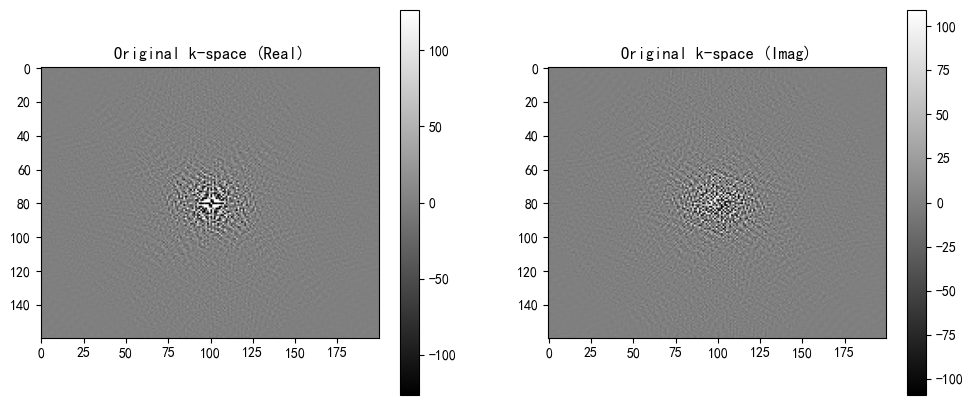

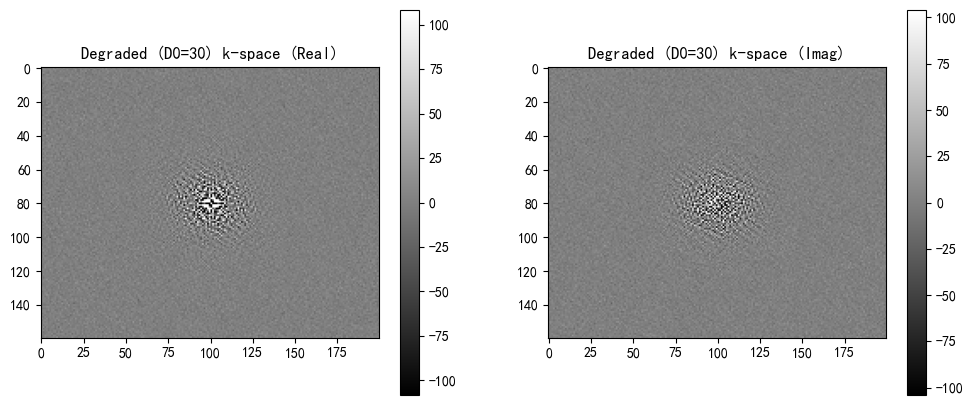

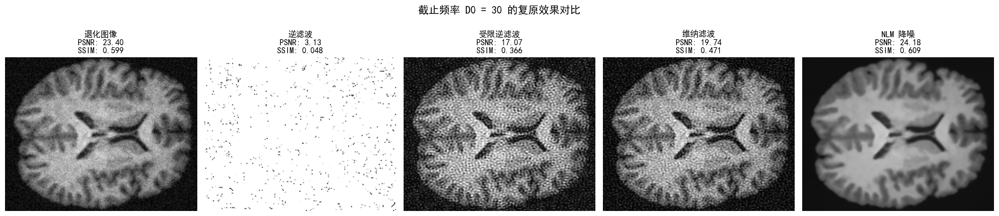

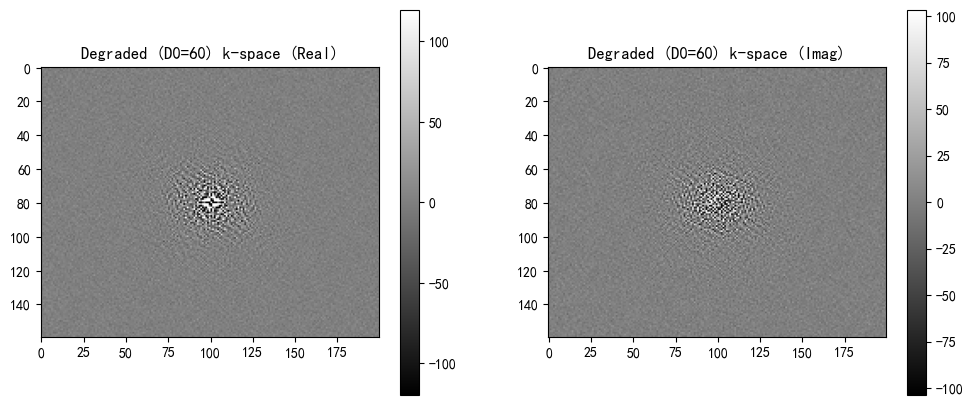

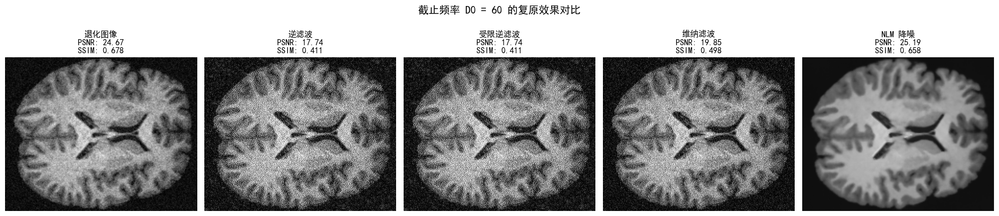

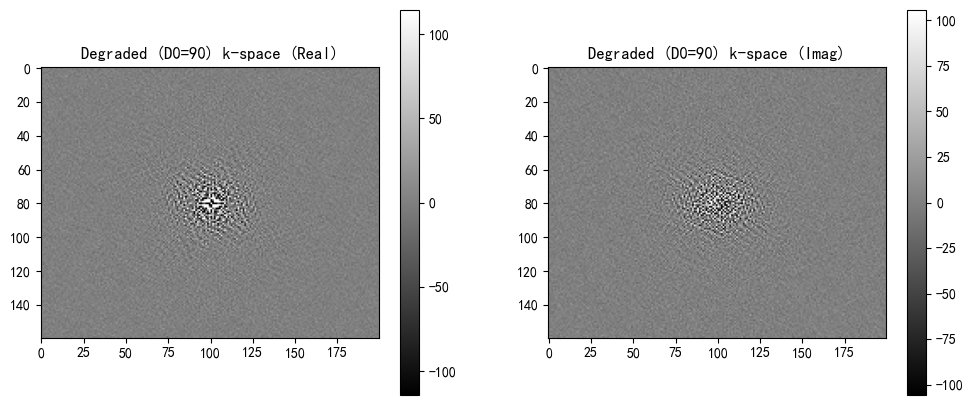

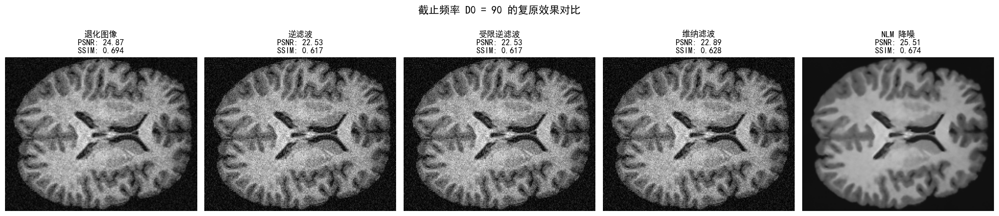

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.restoration import denoise_nl_means

# 解决中文显示问题
matplotlib.rcParams['font.sans-serif'] = ['SimHei', 'Songti SC', 'Arial Unicode MS']
matplotlib.rcParams['axes.unicode_minus'] = False

def normalize_image(image):
    """归一化图像到 [0, 1]"""
    return (image - np.min(image)) / (np.max(image) - np.min(image))

def create_gaussian_lp(shape, D0):
    """生成频域高斯低通滤波器 H(u,v) """
    M, N = shape
    u = np.arange(M) - M // 2
    v = np.arange(N) - N // 2
    U, V = np.meshgrid(u, v, indexing='ij')
    D = np.sqrt(U**2 + V**2)
    H = np.exp(-(D**2) / (2 * D0**2))
    return H

def add_rician_noise(image, sigma):
    """添加莱斯噪声"""
    # 按照公式：x = sqrt((v + eps_real)^2 + (0 + eps_imag)^2)
    eps_real = np.random.normal(0, sigma, image.shape)
    eps_imag = np.random.normal(0, sigma, image.shape)
    noisy_image = np.sqrt((image + eps_real)**2 + eps_imag**2)
    return noisy_image

def show_k_space(F_shift, title_prefix):
    """展示 K 空间的实部和虚部 """
    real_part = np.real(F_shift)
    imag_part = np.imag(F_shift)
    
    # 为了可视化清晰，限制显示范围
    v_real = np.percentile(np.abs(real_part), 99.5)
    v_imag = np.percentile(np.abs(imag_part), 99.5)
    
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(real_part, cmap='gray', vmin=-v_real, vmax=v_real)
    plt.title(f"{title_prefix} k-space (Real)")
    plt.colorbar()
    
    plt.subplot(1, 2, 2)
    plt.imshow(imag_part, cmap='gray', vmin=-v_imag, vmax=v_imag)
    plt.title(f"{title_prefix} k-space (Imag)")
    plt.colorbar()
    plt.show()

def main():
    # 1. 加载数据
    path = './lab4/data/lab4-3.npy'
    try:
        img = np.load(path)
        if img.ndim == 3: img = img[:, :, img.shape[2] // 2]
    except:
        img = np.zeros((256, 256)); img[64:192, 64:192] = 1
    
    img_orig = normalize_image(img)
    F_orig = np.fft.fftshift(np.fft.fft2(img_orig))
    
    # 可视化原始 K 空间
    show_k_space(F_orig, "Original")

    # 实验设置
    D0_list = [30, 60, 90]
    sigma = 0.05  # 莱斯噪声标准差
    K_wiener = 0.02  # 维纳滤波常数 
    
    for D0 in D0_list:
        # --- 2. 退化过程 ---
        # A. 频域模糊 
        H = create_gaussian_lp(img_orig.shape, D0)
        G_blur_freq = F_orig * H
        img_blur = np.abs(np.fft.ifft2(np.fft.ifftshift(G_blur_freq)))
        
        # B. 添加莱斯噪声 
        img_deg = add_rician_noise(img_blur, sigma)
        F_deg = np.fft.fftshift(np.fft.fft2(img_deg))
        
        # 展示退化后的 K 空间
        show_k_space(F_deg, f"Degraded (D0={D0})")
        
        # --- 3. 复原过程 ---
        # 逆滤波 
        F_inv = F_deg / (H + 1e-8)
        img_inv = np.abs(np.fft.ifft2(np.fft.ifftshift(F_inv)))
        
        # 受限逆滤波 (阈值设为 0.1) 
    
        H_lim = np.zeros_like(H)
        H_lim[H > 0.1] = 1 / H[H > 0.1]
        F_lim = F_deg * H_lim
        img_lim = np.abs(np.fft.ifft2(np.fft.ifftshift(F_lim)))
        
        # 维纳滤波 
        H_wie = np.conj(H) / (np.abs(H)**2 + K_wiener)
        F_wie = F_deg * H_wie
        img_wie = np.abs(np.fft.ifft2(np.fft.ifftshift(F_wie)))
        
        # NLM 降噪 
        img_nlm = denoise_nl_means(img_deg, h=1.2*sigma, fast_mode=True, patch_size=5, patch_distance=15)

        # --- 4. 可视化与评估  ---
        fig, axes = plt.subplots(1, 5, figsize=(20, 5))
        titles = ["退化图像", "逆滤波", "受限逆滤波", "维纳滤波", "NLM 降噪"]
        imgs = [img_deg, img_inv, img_lim, img_wie, img_nlm]
        
        for ax, i, t in zip(axes, imgs, titles):
            p = psnr(img_orig, np.clip(i, 0, 1), data_range=1)
            s = ssim(img_orig, np.clip(i, 0, 1), data_range=1)
            ax.imshow(i, cmap='gray', vmin=0, vmax=1)
            ax.set_title(f"{t}\nPSNR: {p:.2f}\nSSIM: {s:.3f}")
            ax.axis('off')
        
        plt.suptitle(f"截止频率 D0 = {D0} 的复原效果对比", fontsize=15)
        plt.tight_layout()
        plt.show()

if __name__ == "__main__":
    main()